<a href="https://colab.research.google.com/github/JuanDavid1217/Generative-AI-from-Scratch/blob/main/GAN/GAN_from_Scratch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import cv2
import os

**Import a MNIST dataset**

In [2]:
from keras.datasets import mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()

x_train = x_train.astype('float32')/ 255
x_test  = x_test.astype( 'float32')/ 255
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test  = x_test.reshape( (len(x_test),  np.prod(x_test.shape[1:])))

11490434/11490434 [==============================] - 0s 0us/step


**Activation Class**

In [3]:
class Activation_ReLU:
  def __init__(self):
    self.input=[]
    self.output=[]
    self.dinputs=[]

  def forward(self, input):
    self.input = input
    self.output=np.maximum(0, input)

  def backward(self, dvalues):
    dvalues = np.sum(dvalues, axis=0, keepdims=True)
    self.dinputs=dvalues*np.where(self.output > 0, 1, 0)

class Activation_LakyReLU:
  def __init__(self):
    self.input=[]
    self.output=[]
    self.dinputs=[]

  def forward(self, input):
    self.input = input
    self.output=np.maximum(0.01*input, input)

  def backward(self, dvalues):
    dvalues = np.sum(dvalues, axis=0, keepdims=True)
    self.dinputs=(dvalues >= 0) * 1 + (dvalues < 0) * 0.01

class Activation_Sigmoid:
  def __init__(self):
    self.input=[]
    self.output=[]
    self.dinputs=[]

  def forward(self, input):
    self.output = 1 / (1 + np.exp(-input))

  def backward(self, dvalues):
    self.dinputs = dvalues * (1 - self.output) * self.output


class Activation_Tanh:
  def __init__(self):
    self.input=[]
    self.output=[]
    self.dinputs=[]

  def forward(self, input):
    self.input=input
    self.output = np.tanh(input)

  def backward(self, dvalues):
    self.dinputs = dvalues * (1-np.tanh(self.input)**2)

**Dense Class**

In [4]:
class Dense:
  def __init__(self, input_dim, neurons):

    self.weights=0.1*np.random.randn(input_dim, neurons)
    self.biases=np.zeros((1, neurons))
    self.input=[]
    self.output=[]
    self.dweights=0
    self.dbiases=0
    self.dinputs=0

  def  forward(self, input):
    self.input=input
    self.output=np.dot(self.input, self.weights)+self.biases

  def backward(self, dvalues):
    self.dbiases=dvalues
    if self.input.shape[0]!=1:
        self.input=self.input.reshape(1, -1)
    self.dweights=np.dot(self.input.T,dvalues)
    self.dinputs=np.dot(dvalues, self.weights.T)

**Generator**

In [163]:
class Generator:
  def __init__(self, latent_dim, intermediate_dim, output_dim):
    self.layer1=Dense(latent_dim, intermediate_dim)
    self.layer1Activation=Activation_ReLU()
    self.layer2=Dense(intermediate_dim, output_dim)
    self.layer2Activation=Activation_Sigmoid()#Tanh()
    self.trinable_layers=[self.layer1, self.layer2]
    self.optimizer=Optimizer_Adam(learning_rate=0.001)

  def generate(self, input):
    self.layer1.forward(input)
    self.layer1Activation.forward(self.layer1.output)


    self.layer2.forward(self.layer1Activation.output)
    self.layer2Activation.forward(self.layer2.output)

    return self.layer2Activation.output

  def backward(self, loss, optimize=False):
    self.layer2Activation.backward(loss)
    self.layer2.backward(self.layer2Activation.dinputs)
    self.layer1Activation.backward(self.layer2.dinputs)
    self.layer1.backward(self.layer1Activation.dinputs)
    if optimize:
      self.optimize()

  def optimize(self):
    self.optimizer.pre_update_params()
    for layer in (self.trinable_layers):
      self.optimizer.update_params(layer)
    self.optimizer.post_update_params()

**Discriminator**

In [6]:
class Discriminator:
  def __init__(self, input_dim, intermediate_dim, output_dim):
    self.layer1=Dense(input_dim, intermediate_dim)
    self.layer1Activation=Activation_ReLU()
    self.layer2=Dense(intermediate_dim, output_dim)
    self.layer2Activation=Activation_Sigmoid()
    self.trainable_layers=[self.layer1, self.layer2]
    self.optimizer=Optimizer_Adam(learning_rate=0.0002)

  def discriminate(self, input):
    self.layer1.forward(input)
    self.layer1Activation.forward(self.layer1.output)

    self.layer2.forward(self.layer1Activation.output)
    self.layer2Activation.forward(self.layer2.output)

    return self.layer2Activation.output

  def backward(self, loss, optimize=False):
    self.layer2Activation.backward(loss)
    self.layer2.backward(self.layer2Activation.dinputs)
    self.layer1Activation.backward(self.layer2.dinputs)
    self.layer1.backward(self.layer1Activation.dinputs)
    if optimize:
      self.optimize()

  def optimize(self):
    self.optimizer.pre_update_params()
    for layer in (self.trainable_layers):
      self.optimizer.update_params(layer)
    self.optimizer.post_update_params()

**Carga de imagenes de rostros (Son volatiles)**

In [144]:
images_train=os.listdir('./flowers/normal')
low_images_train=os.listdir('./flowers/baja')
#low_images_test=os.listdir('./flowers/test/low')
#images_train.remove('.ipynb_checkpoints')
#low_images_train.remove('.ipynb_checkpoints')
images_train.sort()
print(images_train)
low_images_train.sort()
print(low_images_train)
#print(len(low_images_test))

['1.png', '10.png', '11.png', '12.png', '13.png', '14.png', '15.png', '16.png', '17 .png', '18.png', '19.png', '2.png', '20.png', '21.png', '22.png', '23.png', '24.png', '25.png', '3.png', '4.png', '5.png', '6.png', '7.png', '8.png', '9.png']
['1.png', '10.png', '11.png', '12.png', '13.png', '14.png', '15.png', '16.png', '17.png', '18.png', '19.png', '2.png', '20.png', '21.png', '22.png', '23.png', '24.png', '25.png', '3.png', '4.png', '5.png', '6.png', '7.png', '8.png', '9.png']


In [145]:
for i in range(len(images_train)):
  images_train[i]=cv2.imread('./flowers/normal/'+images_train[i],0)
  low_images_train[i]=cv2.imread('./flowers/baja/'+low_images_train[i],0)
#for i in range(len(low_images_test)):
#  low_images_test[i]=cv2.imread('./flowers/test/low/'+low_images_test[i],0)

In [146]:
for i in range(len(images_train)):
  images_train[i]=np.array(images_train[i]).reshape(1,-1)
  images_train[i]=images_train[i].astype('float32')/255
  low_images_train[i]=np.array(low_images_train[i]).reshape(1,-1)
  low_images_train[i]=low_images_train[i].astype('float32')/255

#for i in range(len(low_images_test)):
#  low_images_test[i]=np.array(low_images_test[i]).reshape(1,-1)
#  low_images_test[i]=low_images_test[i].astype('float32')/255

**Creación de un Autoencoder para la mejora de resolución**

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219


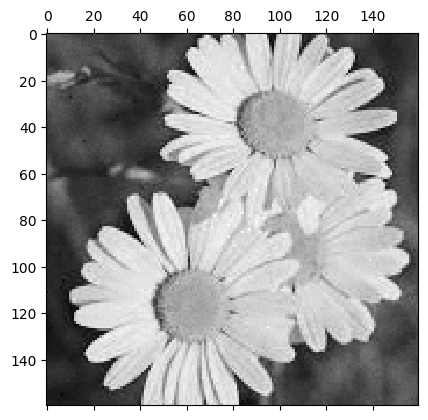

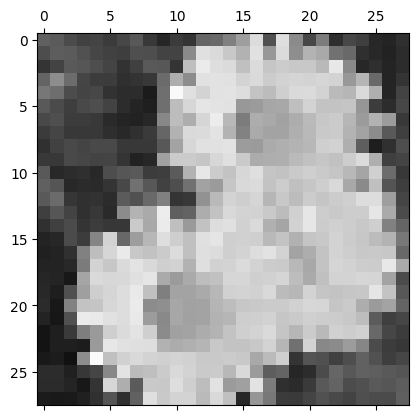

In [147]:
#test generator
latent_dim=784
intermediate_dim=200
output_dim=25600
generator=Generator(latent_dim, intermediate_dim, output_dim)
for j in range(220):
  print(j)
  for i in range(len(low_images_train)):
    generated_data=generator.generate(low_images_train[i])
    loss=generated_data-images_train[i]
    generator.backward(loss, optimize=True)
number=2
generated_data=generator.generate(low_images_train[number])
plt.matshow(generated_data.reshape((160,160)), cmap='gray', clim=(0,1))
plt.matshow(low_images_train[number].reshape((28,28)), cmap='gray', clim=(0,1))

**Prueba de que nuestro discriminador funcione bien**

In [ ]:
#test generator
input_dim=784
intermediate_dim=200
output_dim=1

discriminator=Discriminator(input_dim, intermediate_dim, output_dim)
generator2=Generator(2,200,784)
#generated_data=generator.generate(np.random.normal(0, 1, size=(1,2)))
#plt.matshow(generated_data.reshape((28,28)), cmap='Purples_r', clim=(0,1))
for i in range(50):
  for img in x_train[0:10]:
    discriminated_data=discriminator.discriminate(img)
    loss=discriminated_data-np.array([1])#lossFunction.forward(discriminated_data,np.array([1,1]))
    print("real_prediction: ", discriminated_data)
    discriminator.backward(loss, optimize=True)
    fake_img=generator2.generate(np.random.normal(0,1, size=(1,2)))
    discriminated_fakedata=discriminator.discriminate(fake_img)
    print("fake_prediction: ", discriminated_fakedata)
    loss=discriminated_fakedata#lossFunction.forward(discriminated_fakedata,np.array([0,0]))
    discriminator.backward(loss, optimize=True)#[0][0])#-np.log(discriminated_data[0][0])-np.log(1-discriminated_fakedata[0][0]))



**Function Loss**

In [38]:
class LossBinaryCrossEntropy():
  def forward(self, y_pred, y_true):
    y_pred_clipped = np.clip(y_pred, 1e-7, 1 - 1e-7)

    sample_losses = -(y_true * np.log(y_pred_clipped) + (1 - y_true) * np.log(1 - y_pred_clipped))
    #sample_losses = np.mean(sample_losses, axis=1)

    return sample_losses

  def backward(self, dvalues, y_true):
    samples = len(dvalues)
    outputs = len(dvalues[0])

    clipped_dvalues = np.clip(dvalues, 1e-7, 1 - 1e-7)

    self.dinputs = -(y_true / clipped_dvalues - (1 - y_true)
                     /(1 - clipped_dvalues))/outputs

    self.dinputs = self.dinputs / samples

**Optimizer**

In [11]:
class Optimizer_Adam:
  def __init__(self, learning_rate=0.01, decay=0., epsilon=1e-7,beta_1=0.9, beta_2=0.999):
    self.learning_rate = learning_rate
    self.current_learning_rate = learning_rate
    self.decay = decay
    self.iterations = 0
    self.epsilon = epsilon
    self.beta_1 = beta_1
    self.beta_2 = beta_2


  def pre_update_params(self):
    if self.decay:
      self.current_learning_rate = self.learning_rate * (1. / (1. + self.decay * self.iterations))

  def update_params(self, layer):
    if not hasattr(layer, 'weight_cache'):
      layer.weight_momentums = np.zeros_like(layer.weights)
      layer.weight_cache = np.zeros_like(layer.weights)
      layer.bias_momentums = np.zeros_like(layer.biases)
      layer.bias_cache = np.zeros_like(layer.biases)

    # Update momentum with current gradients
    layer.weight_momentums = self.beta_1 * layer.weight_momentums + (1 - self.beta_1) * layer.dweights
    layer.bias_momentums = self.beta_1 * layer.bias_momentums + (1 - self.beta_1) * layer.dbiases
    # Get corrected momentum
    # self.iteration is 0 at first pass
    # and we need to start with 1 here
    weight_momentums_corrected = layer.weight_momentums / (1 - self.beta_1 ** (self.iterations + 1))
    bias_momentums_corrected = layer.bias_momentums / (1 - self.beta_1 ** (self.iterations + 1))
    # Update cache with squared current gradients
    layer.weight_cache = self.beta_2 * layer.weight_cache + (1 - self.beta_2) * layer.dweights**2
    layer.bias_cache = self.beta_2 * layer.bias_cache + (1 - self.beta_2) * layer.dbiases**2
    # Get corrected cache
    weight_cache_corrected = layer.weight_cache / (1 - self.beta_2 ** (self.iterations + 1))
    bias_cache_corrected = layer.bias_cache / (1 - self.beta_2 ** (self.iterations + 1))
    # Vanilla SGD parameter update + normalization
    # with square rooted cache
    layer.weights += -self.current_learning_rate * weight_momentums_corrected / (np.sqrt(weight_cache_corrected) + self.epsilon)
    layer.biases += -self.current_learning_rate * bias_momentums_corrected / (np.sqrt(bias_cache_corrected) + self.epsilon)

  # Call once after any parameter updates
  def post_update_params(self):
    self.iterations += 1

**GAN**

In [12]:
class GAN:
  def __init__(self, generator, discriminator):
    self.generator=generator
    self.discriminator=discriminator
    self.lossFunction=LossBinaryCrossEntropy()

  def fit(self, data_train, epoch, batch):
    for i in range(epoch):
      print("epoch",i)
      start_batch=0
      steps=int(len(data_train)/batch)
      for step in range(steps):
        limit_batch=(step+1)*int(len(data_train)/steps)
        print("start: ", start_batch, " end: ", limit_batch)
        for data in data_train[start_batch:limit_batch]:
          sample_z = np.random.normal(0, 1, size=(1,self.generator.layer1.weights.shape[0]))
          fake_image=self.generator.generate(sample_z)

          discriminated_data=self.discriminator.discriminate(data)
          loss=discriminated_data-np.array([1])#lossFunction.forward(discriminated_data,np.array([1,1]))
          self.discriminator.backward(loss, optimize=True)

          discriminated_fakedata=self.discriminator.discriminate(fake_image)
          loss=discriminated_fakedata#lossFunction.forward(discriminated_fakedata,np.array([0,0]))
          self.discriminator.backward(loss, optimize=True)

          sample_z = np.random.normal(0, 1, size=(1,self.generator.layer1.weights.shape[0]))
          fake_image=self.generator.generate(sample_z)
          discriminated_data=self.discriminator.discriminate(fake_image)
          print(discriminated_data)
          loss=discriminated_data-np.array([1])
          self.discriminator.backward(loss)
          self.generator.backward(self.discriminator.layer1.dinputs, optimize=True)
        start_batch=limit_batch

**Entrenamiento con el Dataset de MNIST**

In [73]:
d_input_dim=784
d_intermediate_dim=200
d_output_dim=1
GAN_discriminator=Discriminator(d_input_dim, d_intermediate_dim, d_output_dim)

g_latent_dim=2
g_intermediate_dim=200
g_output_dim=784

GAN_generator=Generator(g_latent_dim, g_intermediate_dim, g_output_dim)





In [ ]:
modelGAN=GAN(GAN_generator, GAN_discriminator)
modelGAN.fit(x_train[0:30], 1000, 10)

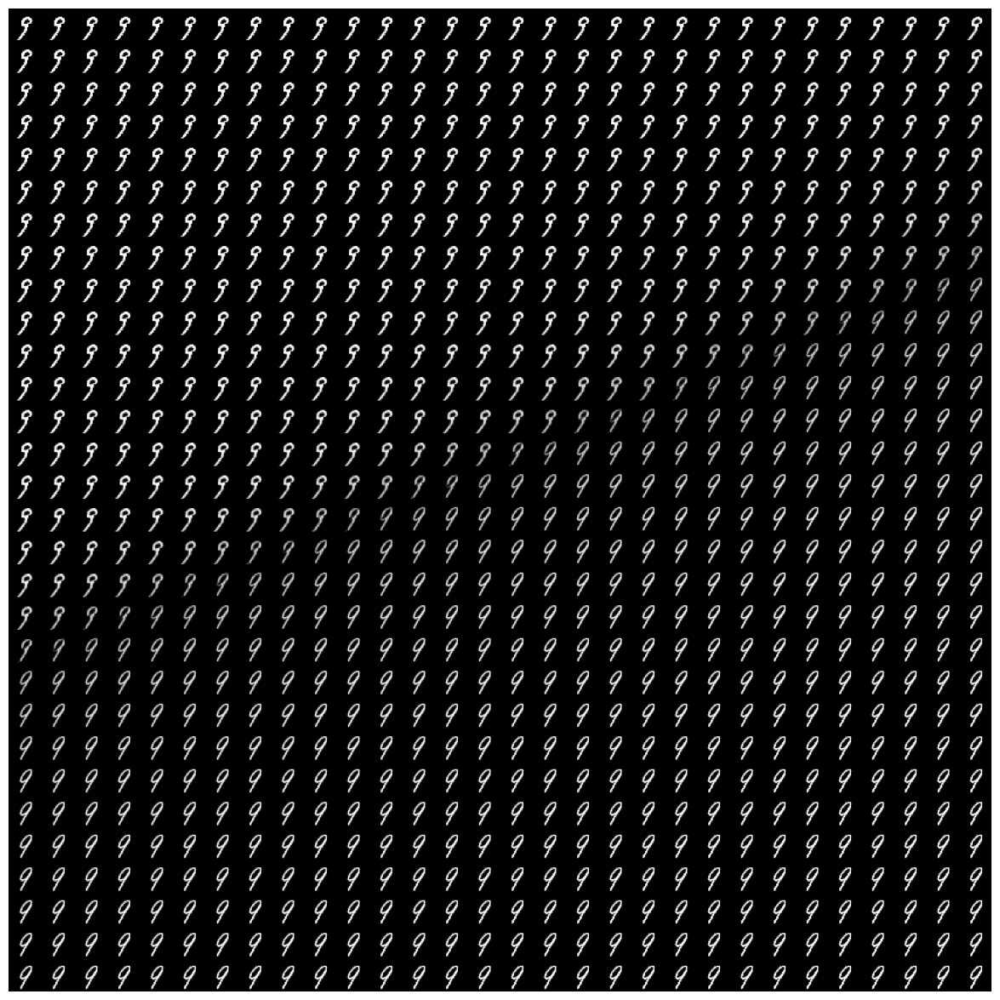

In [75]:
numImgs = 30
newrows,newcols=28,28
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        Im=modelGAN.generator.generate(z)
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = Im.reshape((newrows,newcols))

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()
#plt.matshow(generator.generate(np.random.normal(0,1, size=(1,2))).reshape(28,28))

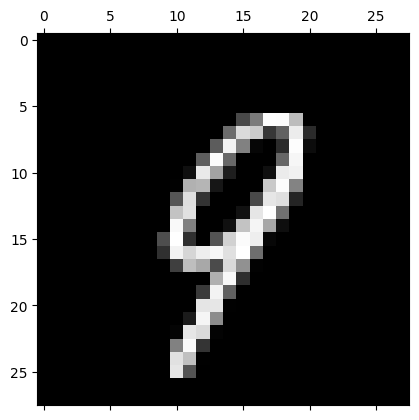

In [80]:
plt.matshow(modelGAN.generator.generate(np.random.normal(0,1, size=(1,2))).reshape(28,28), cmap='gray')

**Probando con otras imagenes**

In [ ]:
!git clone https://github.com/FaustineLi/Variational-Autoencoders.git

In [ ]:
cd /content

In [ ]:
cd Variational-Autoencoders/

In [ ]:
import scipy.io
sil = scipy.io.loadmat('./resources/data/caltech101_16.mat')
silX = sil['X']
silY = sil['Y']
silX_train = silX[np.where(sil['Y'] == 87)[1],:][0:80,:]
silX_test  = silX[np.where(sil['Y'] == 87)[1],:][81:,:]

In [ ]:
d_input_dim=256
d_intermediate_dim=200
d_output_dim=1
GAN_discriminator=Discriminator(d_input_dim, d_intermediate_dim, d_output_dim)

g_latent_dim=2
g_intermediate_dim=200
g_output_dim=256

GAN_generator=Generator(g_latent_dim, g_intermediate_dim, g_output_dim)


In [ ]:
modelGAN=GAN(GAN_generator, GAN_discriminator)
modelGAN.fit(silX_train[0:30], 1000, 10)

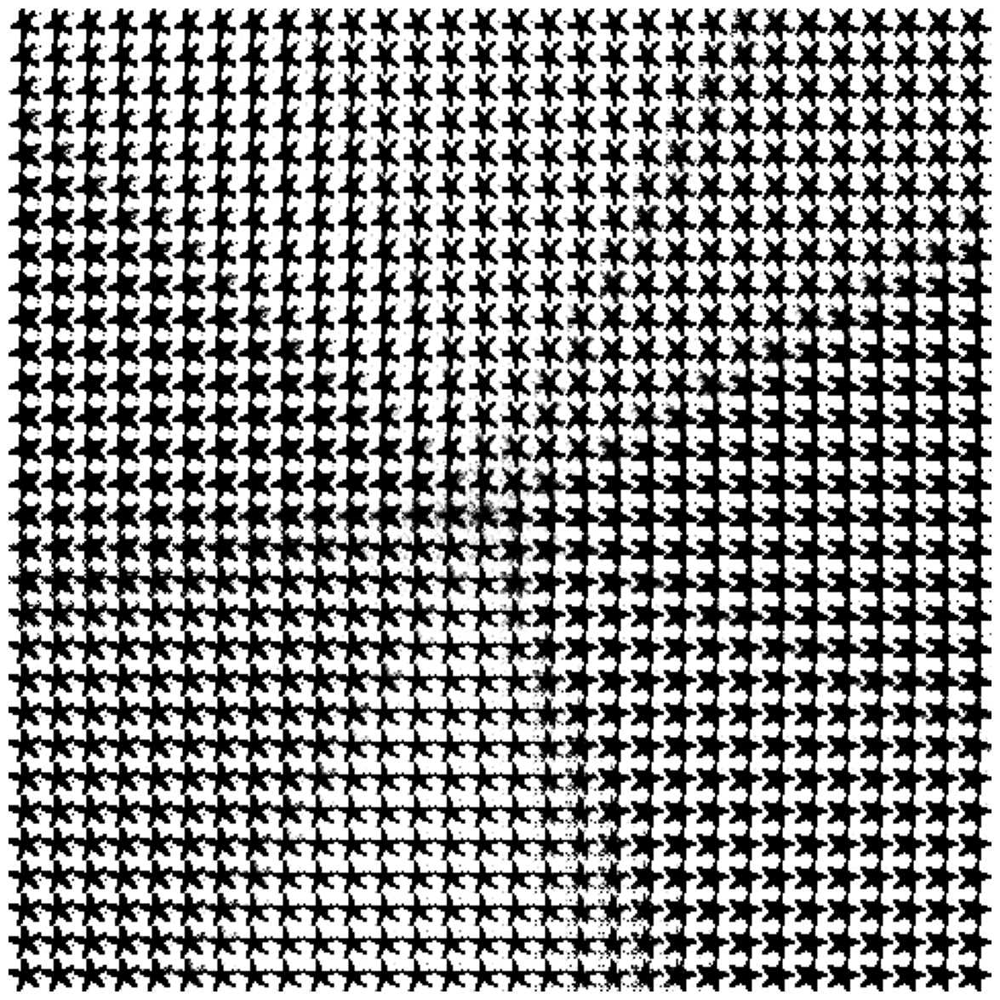

In [ ]:
numImgs = 30
newrows,newcols=16,16
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        Im=modelGAN.generator.generate(z)
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = Im.reshape((newrows,newcols))

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()

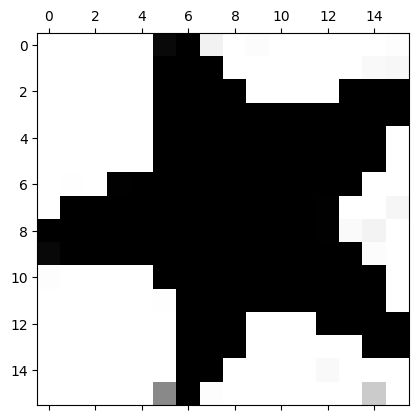

In [ ]:
plt.matshow(modelGAN.generator.generate(np.random.normal(0,1, size=(1,2))).reshape(16,16), cmap='gray')

**Prueba con el dataset FASHION**

In [ ]:
from keras.datasets import fashion_mnist
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

x_train = x_train.astype('float32')/ 255
x_test  = x_test.astype( 'float32')/ 255
x_train = x_train.reshape((len(x_train), np.prod(x_train.shape[1:])))
x_test  = x_test.reshape( (len(x_test),  np.prod(x_test.shape[1:])))

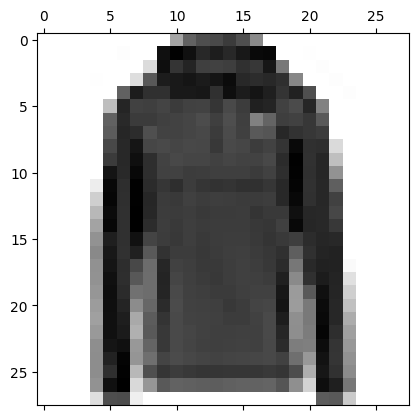

In [ ]:
plt.matshow(x_train[24].reshape(28,28), cmap="gray_r")

In [ ]:
d_input_dim=784
d_intermediate_dim=200
d_output_dim=1
GAN_discriminator=Discriminator(d_input_dim, d_intermediate_dim, d_output_dim)

g_latent_dim=2
g_intermediate_dim=200
g_output_dim=784

GAN_generator=Generator(g_latent_dim, g_intermediate_dim, g_output_dim)

In [ ]:
modelGAN=GAN(GAN_generator, GAN_discriminator)
modelGAN.fit(x_train[0:30], 1000, 10)

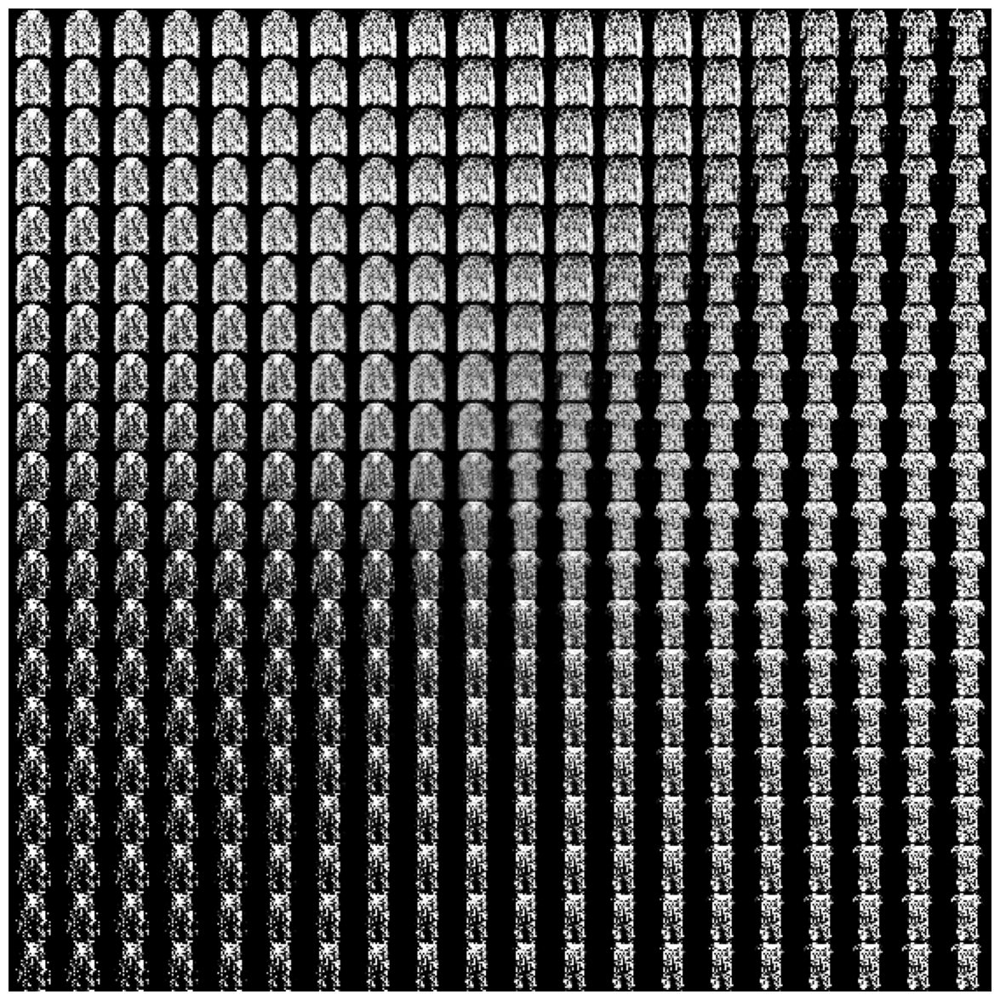

In [ ]:
numImgs = 20
newrows,newcols=28,28
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        Im=modelGAN.generator.generate(z)
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = Im.reshape((newrows,newcols))

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()

**Prueba con los rostros cargados previamente**

In [129]:
d_input_dim=784
d_intermediate_dim=200
d_output_dim=1
GAN_discriminator=Discriminator(d_input_dim, d_intermediate_dim, d_output_dim)

g_latent_dim=2
g_intermediate_dim=200
g_output_dim=784

GAN_generator=Generator(g_latent_dim, g_intermediate_dim, g_output_dim)

In [ ]:
modelGAN=GAN(GAN_generator, GAN_discriminator)
modelGAN.fit(low_images_train, 1000, 2)

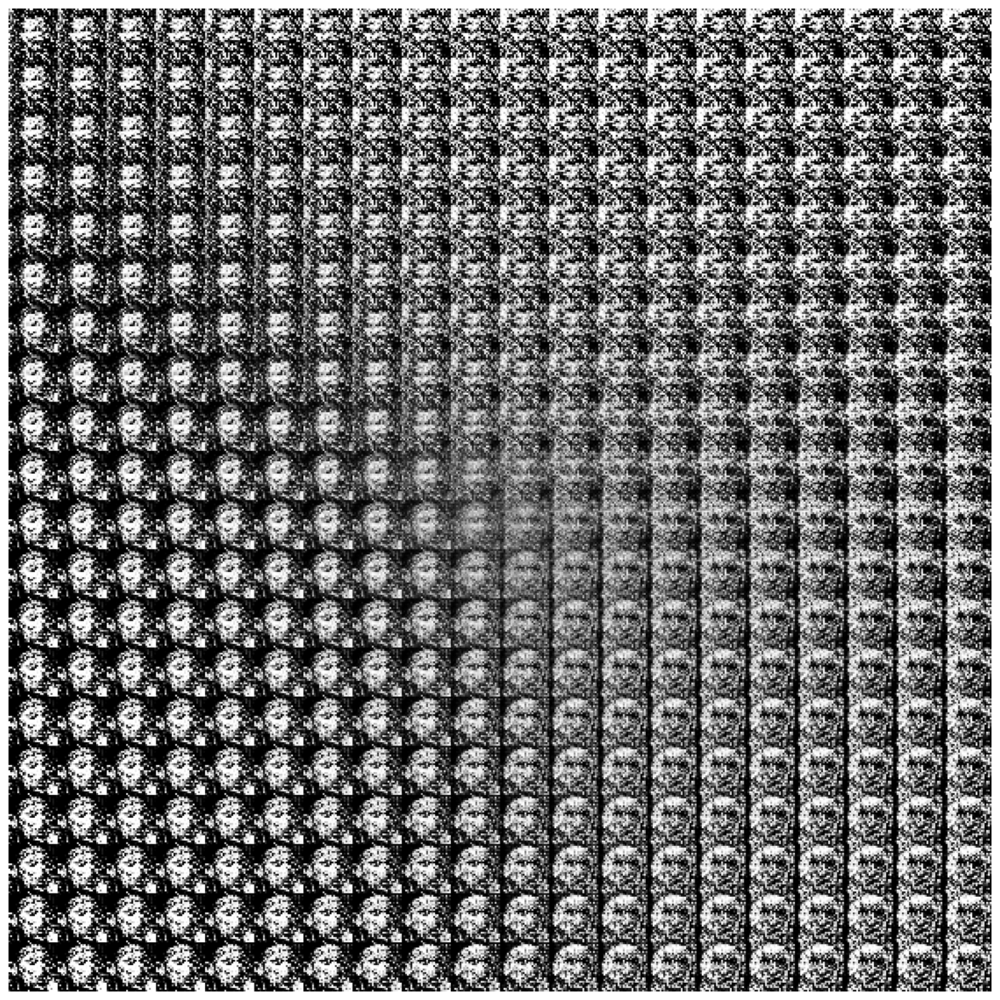

In [139]:
numImgs = 20
newrows,newcols=28,28
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        Im=modelGAN.generator.generate(z)
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = Im.reshape((newrows,newcols))

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()

**Mejora de resolución con ayuda del Autoencoder entrenado previamente**

In [140]:
numImgs = 20
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

images_generated=[]

for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        images_generated.append(modelGAN.generator.generate(z))




In [141]:
images_generated_by_resolution=[]

for img in images_generated:
  images_generated_by_resolution.append(generator.generate(img))

images_generated_by_resolution=np.array(images_generated_by_resolution).reshape(400,25600).reshape(20,20,25600)

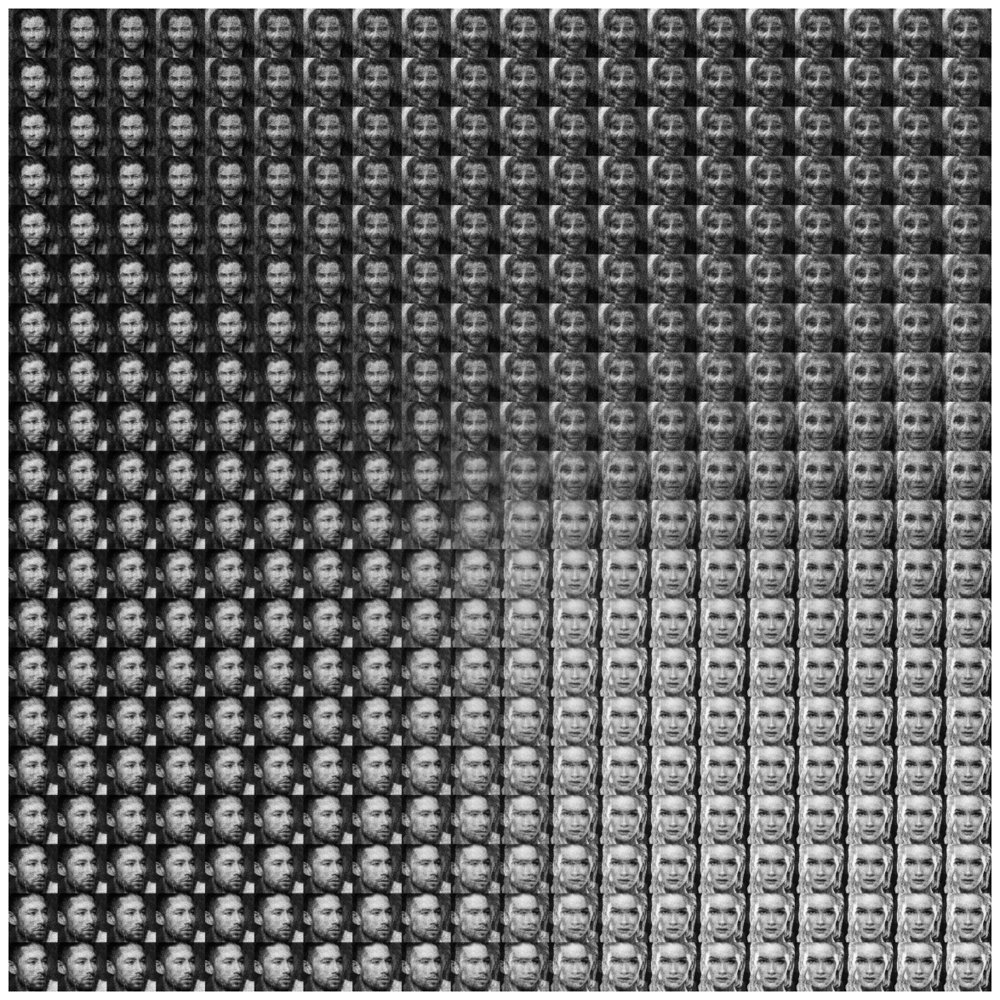

In [142]:
numImgs = 20
newrows,newcols=160,160


import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = images_generated_by_resolution[i][j].reshape(newrows,newcols)

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()

**Flores**

In [165]:
d_input_dim=784
d_intermediate_dim=200
d_output_dim=1
GAN_discriminator=Discriminator(d_input_dim, d_intermediate_dim, d_output_dim)

g_latent_dim=2
g_intermediate_dim=200
g_output_dim=784

GAN_generator=Generator(g_latent_dim, g_intermediate_dim, g_output_dim)

In [ ]:
modelGAN=GAN(GAN_generator, GAN_discriminator)
modelGAN.fit(low_images_train, 1000, 5)

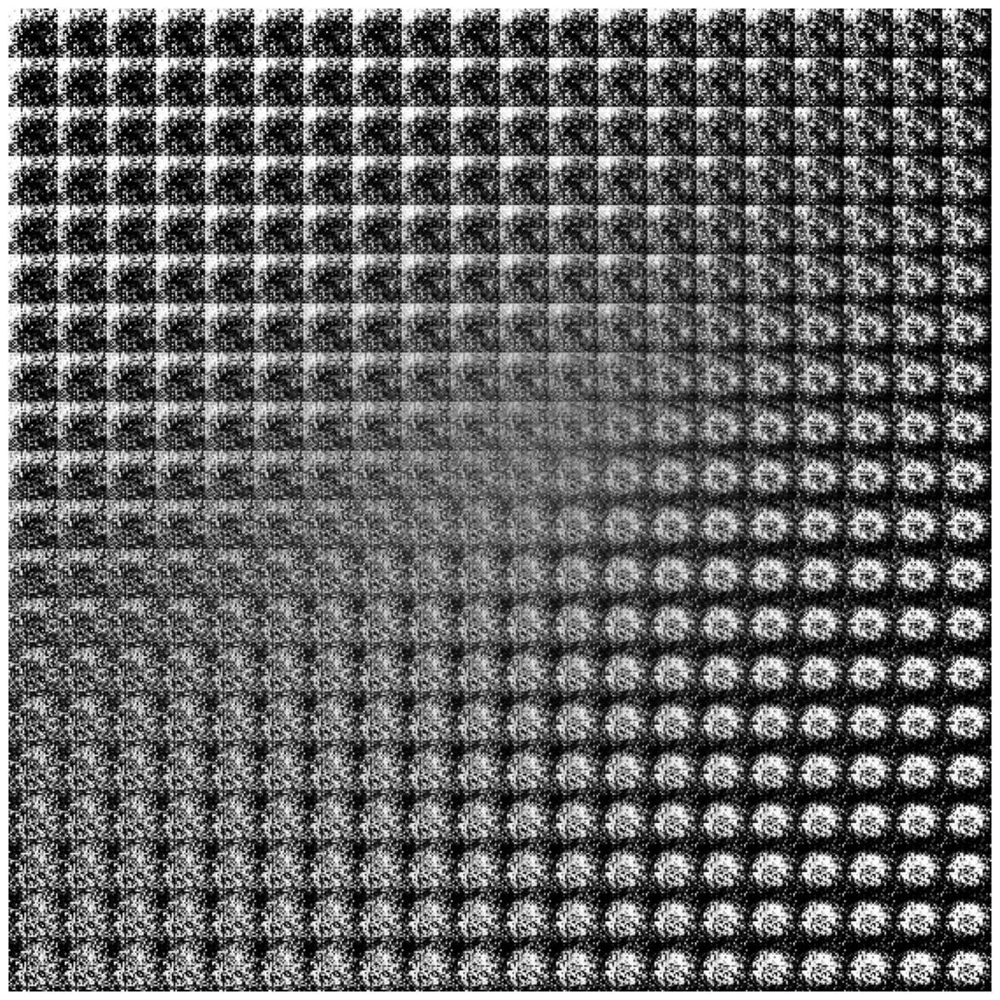

In [168]:
numImgs = 20
newrows,newcols=28,28
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        Im=modelGAN.generator.generate(z)
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = Im.reshape((newrows,newcols))

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()

In [169]:
numImgs = 20
lo, hi  = -3.,3.

z1 = np.linspace(lo, hi, numImgs)
z2 = np.linspace(lo, hi, numImgs)

images_generated=[]

for i in range(numImgs):
    for j in range(numImgs):
        z=np.array([z1[i], z2[j]])
        z=np.expand_dims(z, axis=0)
        images_generated.append(modelGAN.generator.generate(z))

images_generated_by_resolution=[]

for img in images_generated:
  images_generated_by_resolution.append(generator.generate(img))

images_generated_by_resolution=np.array(images_generated_by_resolution).reshape(400,25600).reshape(20,20,25600)

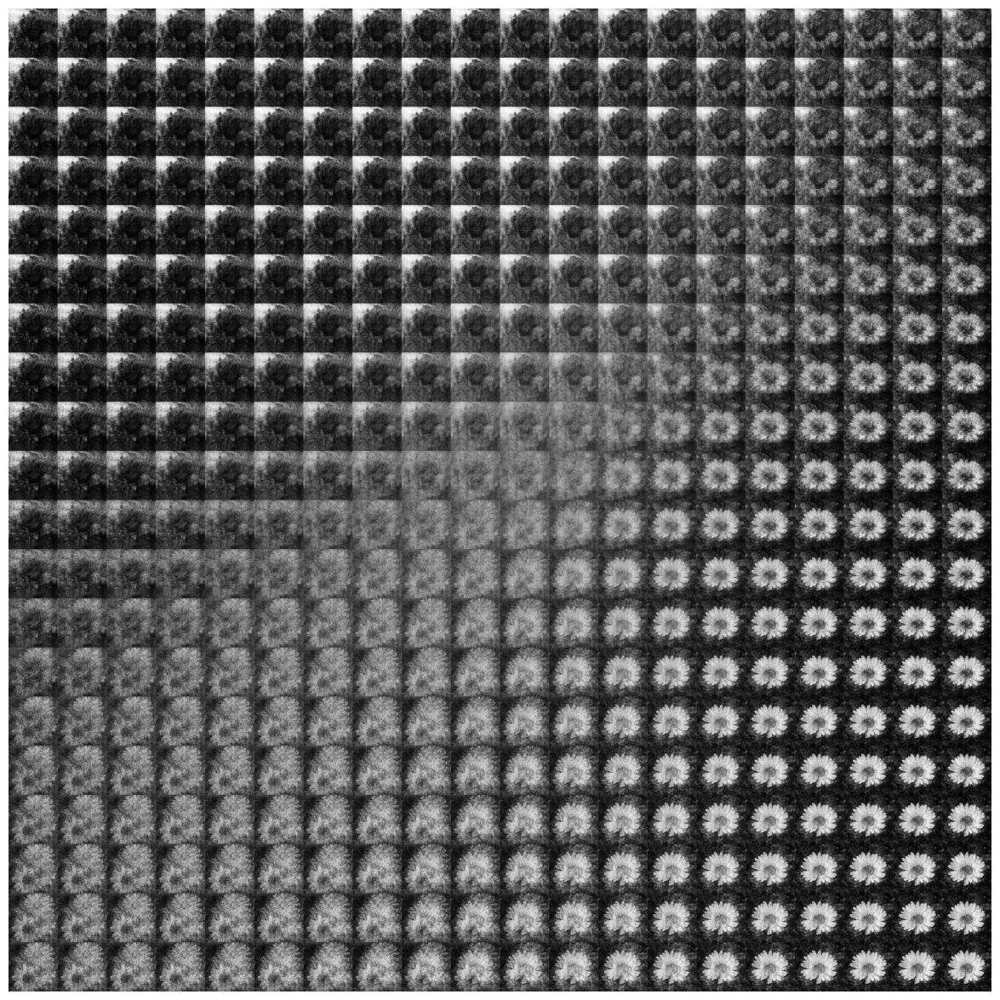

In [172]:
numImgs = 20
newrows,newcols=160,160


import matplotlib.pyplot as plt

plt.figure(figsize=(15,15*newcols/newrows))
canvas=np.zeros((newrows*numImgs,newcols*numImgs))
for i in range(numImgs):
    for j in range(numImgs):
        canvas[newrows*i:newrows*(i+1), newcols*j:newcols*(j+1)] = images_generated_by_resolution[i][j].reshape(newrows,newcols)

plt.imshow(canvas, 'gray')
plt.axis('off')
plt.show()